In [1]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from PIL import Image, ImageOps, ImageFont, ImageDraw
import pandas as pd
import csv
import pickle

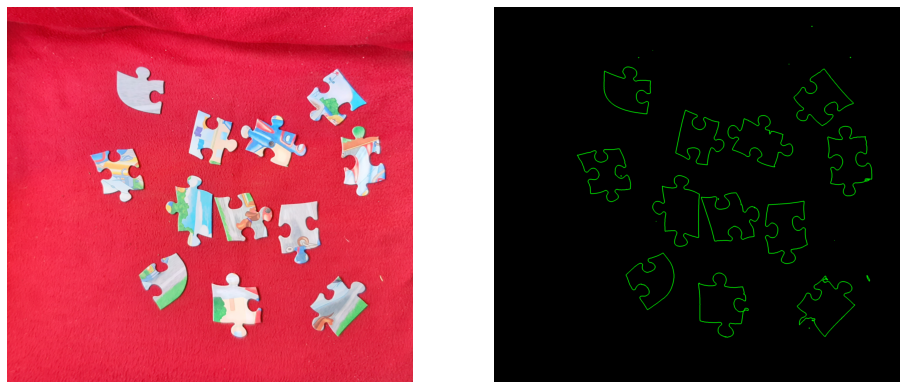

In [2]:
# Load image
image = np.array(Image.open('image/red1.jpg'))

# Get contours
blurred  = cv2.pyrMeanShiftFiltering(image,31,91) 
gray = cv2.cvtColor(blurred,cv2.COLOR_BGR2GRAY)
ret , threshold = cv2.threshold(gray,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

contours, hierarchy = cv2.findContours(threshold, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

image_contours = cv2.drawContours(image * 0, contours, -1, (0,255,0), 3)

# Draw image ans contours
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 16))

ax1.imshow(image)
ax1.axis('off')

ax2.imshow(image_contours)
ax2.axis('off')

plt.show()

In [3]:
# Find threshold for area and perimetr
areas, perimetrs = [], []
for con in contours:
    areas.append(cv2.contourArea(con))
    perimetrs.append(cv2.arcLength(con, closed=True))
threshold_ar = np.mean(sorted(areas, reverse=True)[:100])
threshold_pr = np.mean(sorted(perimetrs, reverse=True)[:100])

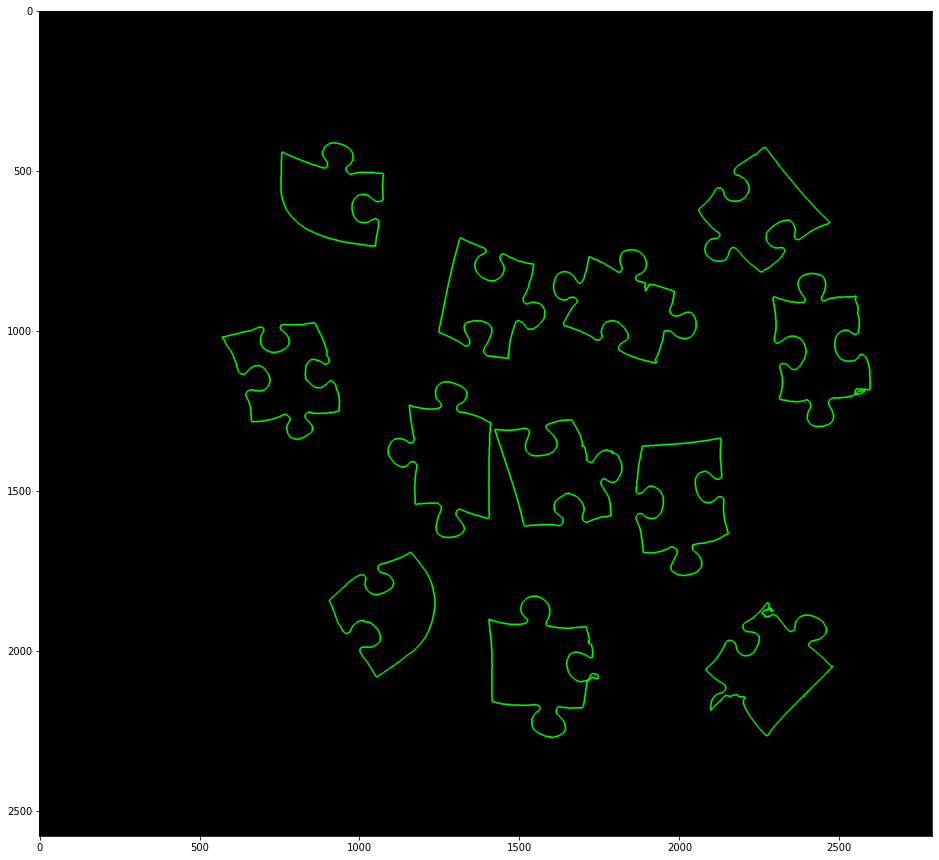

In [4]:
# Delete useless contours
filter_contours = []
for i in range(len(contours)):
    if cv2.contourArea(contours[i]) > threshold_ar and cv2.arcLength(contours[i], closed=True) > threshold_pr:
        filter_contours.append(contours[i])
contours = filter_contours

image_contours = cv2.drawContours(image * 0, contours, -1, (0,255,0), 3)

# Draw contours
plt.figure(figsize=(16, 16))
plt.imshow(image_contours)
plt.show()

In [5]:
# Cut puzzles from image
puzzles = []
for c in contours:
    figure = c[:,0,:]
    B, A = np.min(figure, axis=0)
    D, C = np.max(figure, axis=0)
    puzzles.append(image[max(0, A - 10): min(image.shape[0] - 1, C + 10), max(0, B - 10): min(image.shape[1] -1, D + 10),:])

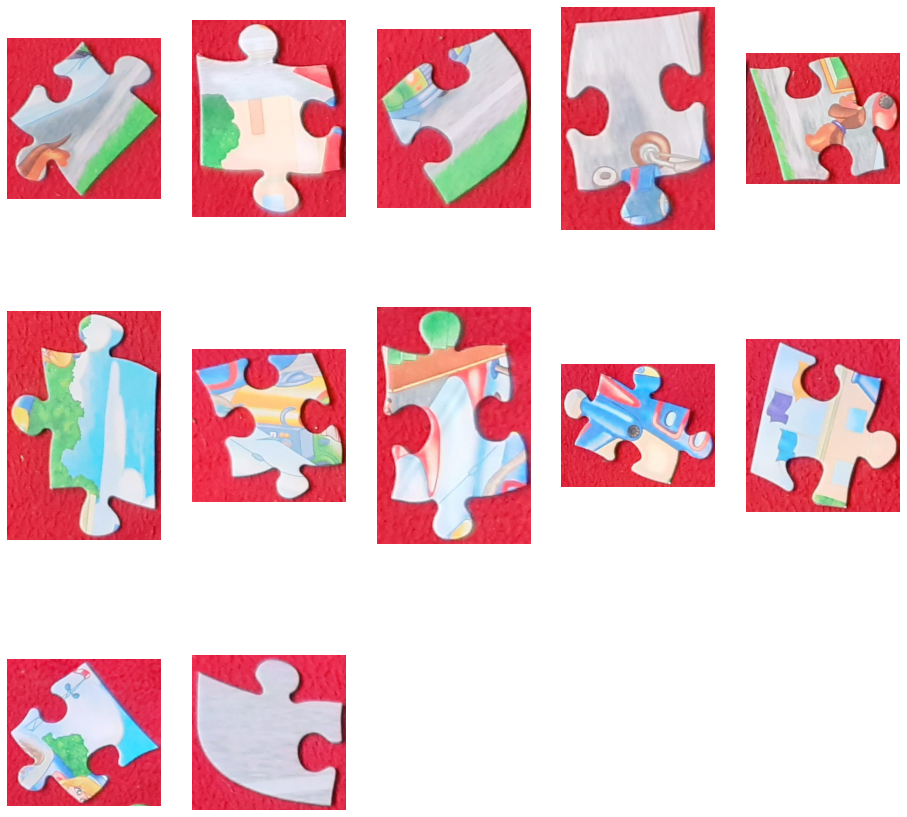

In [6]:
# Draw puzzles
fig = plt.figure(figsize=(16, 16))
columns = 5
rows = len(puzzles) / 5 + 1
for i in range(1, len(puzzles) + 1):
    fig.add_subplot(rows, columns, i)
    plt.axis('off')
    plt.imshow(puzzles[i - 1])
plt.show()

In [7]:
# Get binarization for one puzzle
def get_puzzle_binarization(puzzle):
    gray = cv2.cvtColor(puzzle, cv2.COLOR_BGR2GRAY)
    ret, threshold = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    contours, hierarchy = cv2.findContours(threshold, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    max_con_len = contours[0].shape[0]
    max_con = contours[0]
    for con in contours:
        if con.shape[0] > max_con_len:
            max_con = con
            max_con_len = con.shape[0]
    main_con = [max_con]
    output = cv2.fillPoly(puzzle * 0 + 255, main_con, (0, 0, 0))
    q = max(output.shape) + 100
    m = np.zeros((q, q, 3), dtype='uint8') + 255
    m[(q - output.shape[0]) // 2 :(q - output.shape[0]) // 2  + output.shape[0],(q - output.shape[1]) // 2 : (q - output.shape[1]) // 2 + output.shape[1],:] = output
    m[m == 0] = 1
    m[m == 255] = 0
    m[m == 1] = 255
    return m

In [8]:
# Get puzzles binarizations
puzzle_image = []
for puz in puzzles:
    puzzle_image.append(Image.fromarray(get_puzzle_binarization(puz)).resize((30, 30)))

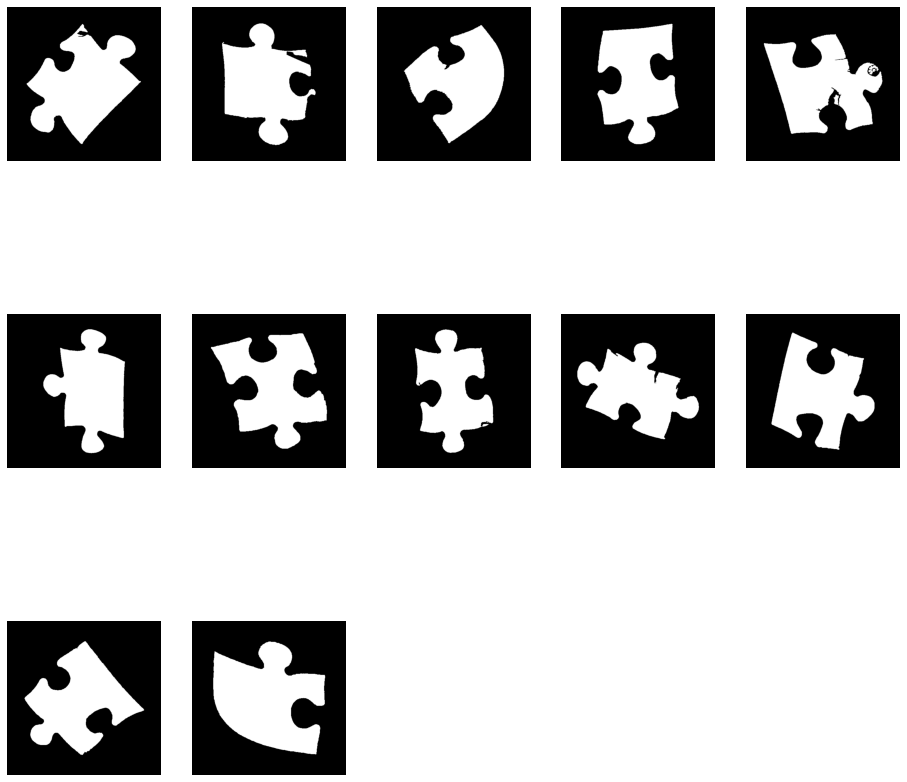

In [9]:
# Draw binarizations
fig = plt.figure(figsize=(16, 16))
columns = 5
rows = len(puzzles) / 5 + 1
for i in range(1, len(puzzles) + 1):
    fig.add_subplot(rows, columns, i)
    plt.axis('off')
    plt.imshow(Image.fromarray(get_puzzle_binarization(puzzles[i - 1])))
plt.show()

In [10]:
# Create test sample
X_test = np.zeros((len(puzzle_image), 900))
for i, puz in enumerate(puzzle_image):
    X_test[i] = np.array(puz)[:,:,0].ravel()

In [11]:
# Load models
model_1 = pickle.load(open('model_1.sav', 'rb'))
model_2 = pickle.load(open('model_2.sav', 'rb'))

# Predict puzzles form
ans_1 = model_1.predict(X_test)
ans_2 = model_2.predict(X_test)

In [12]:
# Draw frames and text
output = Image.fromarray(image)
draw = ImageDraw.Draw(output)
font = ImageFont.truetype("arial.ttf", 100)
for i, c in enumerate(contours):
    figure = c[:,0,:]
    B, A = np.min(figure, axis=0)
    D, C = np.max(figure, axis=0)
    draw.rectangle([(B, A), (D, C)], outline ='green', width=10)
    
for i, c in enumerate(contours):
    draw.text(np.min(c[:,0,:], axis=0), 'P' + str(ans_1[i]) + 'B' + str(ans_2[i]), font=font, fill='blue') 

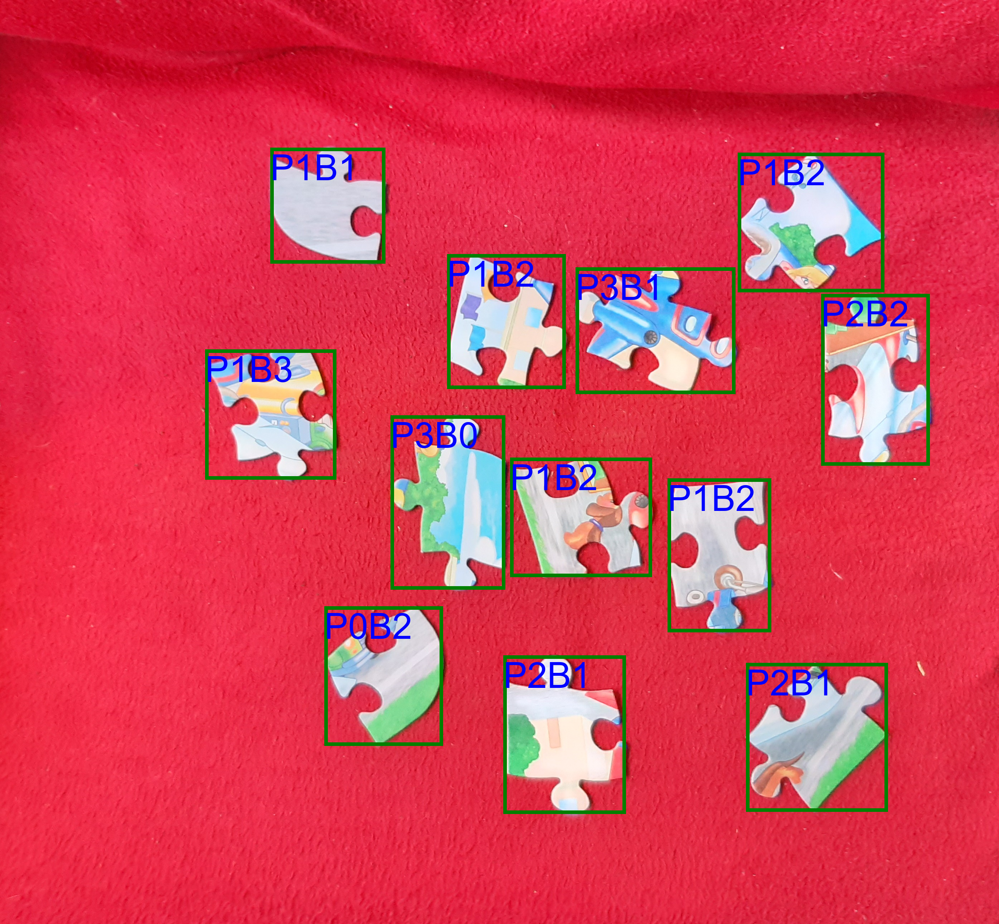

In [13]:
# Result
output